<a href="https://colab.research.google.com/github/pankaj-pundir/The-projects/blob/master/particleSwarmOptimization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
# import pyswarm as pso
import numpy as np
import random
from matplotlib import pyplot as plt
from mpl_toolkits import mplot3d
import matplotlib.animation as animation
from IPython.display import HTML


from matplotlib import rc
rc('animation', html='jshtml')


In [0]:
# class IMP
class Particle:
    def __init__(self,dim,high,low):
        self.dim = dim
        self.low = low
        self.high = high
        self.position = np.random.uniform(low = low,high = high, size = self.dim)
        self.pbest_position = self.position
        self.velocity = np.random.uniform(size = self.dim)
        self.pbest_value = float('inf')
        # self.is_gbest = False
    
    def move(self):
        self.position += self.velocity 
        np.clip(self.position,self.low,self.high,out= self.position)

    def __str__(self):
        return f"Position = {self.position}"

class space:
    def __init__(self,n_particle,dim,high,low):
        self.dim = dim
        self.n_particle = n_particle
        self.gbest_value = float('inf')
        self.gbest_position = np.random.randint(low,high,dim)
        self.particles = [Particle(self.dim,high,low) for i in range(n_particle)]
        
    def funcy(self,a):
        # sphere function
        return (a[0]-4)**2 + (a[1]-3)**2 + 1

    def funcy(self,x):
        # rosenbrock function
	      return sum([100*(x[i+1] - pow(x[i],2))**2 + (1-x[i])**2 for i in range(x.shape[0]-1)])

    def funcy(self,x):
        # Dropwave function
	      return -1*(1+np.cos(12*np.sqrt(x[0]**2+x[1]**2)))/(.5*(x[0]**2 + x[1]**2) + 2) #sum([100*(x[i+1] - pow(x[i],2))**2 + (1-x[i])**2 for i in range(x.shape[0]-1)])

    def funcy(self,x):
        # egg crate function
	      return x[0]**2 + x[1]**2 + 25*(np.sin(x[0])**2 + np.sin(x[1])**2)

    def plot_particles(self):
        li = [ [] for i in range(self.dim)]
        for i in self.particles:
            for j,k in enumerate(i.position):
                li[j].append(k)
        return li
       

    def pbest(self):
        for particle in self.particles:
            evaluate = self.funcy(particle.position)
            if particle.pbest_value > evaluate:
                particle.pbest_value = evaluate
                particle.pbest_position = particle.position.copy()

            if self.gbest_value > evaluate:
                self.gbest_position = particle.position.copy()
                self.gbest_value = evaluate
    

    def move(self):
        global weights
        for i in self.particles:
            cog_vel = weights[1]*np.random.random()*(i.pbest_position - i.position)
            social_vel = weights[2]*np.random.random()*(self.gbest_position - i.position)
            i.velocity = weights[0]*i.velocity + cog_vel + social_vel 
            i.move()


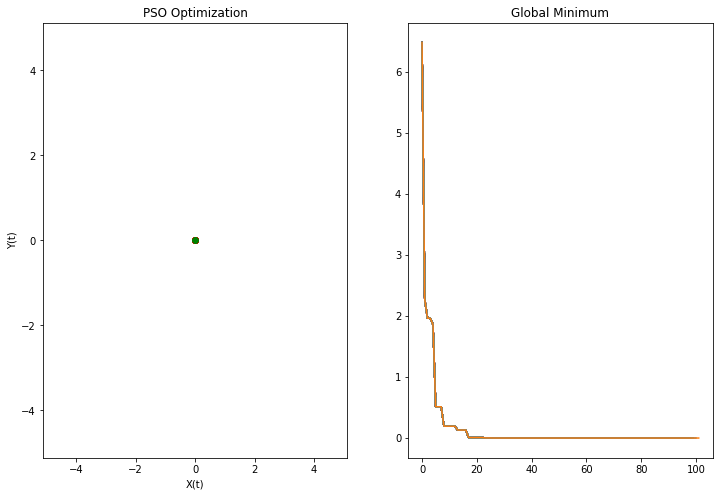

In [78]:
# initialize the values
high = 5.12
low = -5.12

weights = np.array([1,1,2])
optim = space(30,2,high,low)


# define hyerparameters
diff = 5
counter = 1


# plotting
fig,ax = plt.subplots(1,2,figsize=(12,8))

out = optim.plot_particles()
x = out[0]
y = out[1]
rang = 20

line = []
def frame(w):
    global x, y, rang,counter,weights,co,line

    if counter % diff==0:
        weights = weights * 0.9
        
    counter += 1
    optim.pbest()
    optim.move()
    ax[0].clear()
    ax[0].set_title("PSO Optimization")
    ax[0].set_xlabel('X(t)')
    ax[0].set_xlim(low,high)
    ax[0].set_ylabel('Y(t)')
    ax[0].set_ylim(low,high)

    out = optim.plot_particles()
    ax[0].scatter(*out, c='r')
    ax[0].scatter(*optim.gbest_position,c='g')

    line.append(optim.gbest_value)
    ax[1].set_title("Global Minimum")
    ax[1].plot(line)
    
# plotting the animation
anim = animation.FuncAnimation(fig, frame, frames=100, blit=False)
anim

In [79]:
print(optim.gbest_position)
print(optim.gbest_value)

[9.41570320e-12 8.30196821e-13]
2.322962033616084e-21


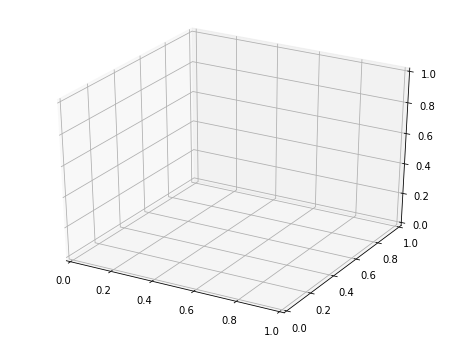

In [0]:
# Reference code for plotting 
fig = plt.figure(figsize=(8,6))
ax = plt.axes(projection='3d')

N=10
x=500*np.random.random(N)
y=500*np.random.random(N)
z=500*np.random.random(N)

In [0]:
def frame(w):
    ax.clear()
    global x,y,z
    x=x+np.random.normal(loc=0.0,scale=50.0,size=10)
    y=y+np.random.normal(loc=0.0,scale=50.0,size=10)
    z=z+np.random.normal(loc=0.0,scale=50.0,size=10)

    plt.title("Brownian Motion")
    ax.set_xlabel('X(t)')
    ax.set_xlim3d(-500.0,500.0)
    ax.set_ylabel('Y(t)')
    ax.set_ylim3d(-500.0,500.0)
    ax.set_zlabel('Z(t)')
    ax.set_zlim3d(-500.0,500.0) 
    plot=ax.scatter3D(x, y, z, c='r')
    return plot

In [0]:
anim = animation.FuncAnimation(fig, frame, frames=100, blit=False, repeat=True)

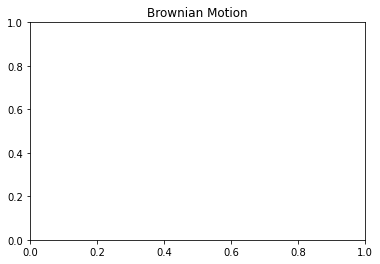

In [0]:
anim